<a href="https://colab.research.google.com/github/haydenclose/Cloud_based_Oil_Detection/blob/main/Copy_of_UserInterface_5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Cloud Based Analysis of Oil Spills from Wrecks
This is a workflow on how to use Google Earth Engine (GEE) with Google Colab to identify and detect oil from shipwreck

Created By Hayden Close


#1 Installation and set-up of workspace

## 1.1 Connect to google drive
First of all connect your google drive account with colab so you can store inputs such as wreck locations and even scripts with functions in.

In [ ]:
import google.colab.drive
google.colab.drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


##1.2 Install and import required libraries
Google Colab has lots of packages aready installed but some need to be installed via `!pip install name` and
`import name`

use `> /dev/null 2>&1; ` to supress outputs as lengthy and clog up the screen.



In [ ]:
!pip install geemap > /dev/null 2>&1;                                                               # Need to install geeMap for easy iteractive plotting
!pip install geopandas > /dev/null 2>&1;                                                            # Install geopandas
!pip install plotly > /dev/null 2>&1;                                                               # Install Ploty for interactive graphs
import ee                                                                                           # To access the earth engine catalogue
import geemap                                                                                       # Imports the geeMap package into environment
import geopandas                                                                                    # Makes working with geospatial data in python easier
import pandas as pd                                                                                 # Useful package to read/export csv's etc...
import ipyleaflet                                                                                   # Needed for interactive plotting
import ipywidgets as widgets                                                                        # Way to have widgets onto geemaps
import math                                                                                         # Used in the gammafilter function
import plotly.express as px                                                                         # Used to plot the spills over time or the values from a line
import os
import requests
from typing import Union, List
from PIL import Image
#import io
import glob
print('Libraries installed')


Libraries installed


##1.3 Download functions file

If you havent already, download the python file with all the functions to run the tools.
The below codes downloads the file with from GitHib with the latest updates. See the script for documentation of the various functions.


In [ ]:
os.chdir('/content')
!wget https://raw.githubusercontent.com/haydenclose/Cloud_based_Oil_Detection/main/Cloud_Based_Oil_Tools.ipynb
%run '/content/Cloud_Based_Oil_Tools.ipynb'

--2023-11-20 10:58:04--  https://raw.githubusercontent.com/haydenclose/Cloud_based_Oil_Detection/main/Cloud_Based_Oil_Tools.ipynb
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 90941 (89K) [text/plain]
Saving to: ‘Cloud_Based_Oil_Tools.ipynb’

Cloud_Based_Oil_Too 100%[===================>]  88.81K  --.-KB/s    in 0.08s   

2023-11-20 10:58:04 (1.05 MB/s) - ‘Cloud_Based_Oil_Tools.ipynb’ saved [90941/90941]



##1.4 Autenticate Earth Engine servers
To access the imagery catalogues you are required to autenticate yourself via your google account. To do this run the `ee.Authenticate` function to authenticate your access to Earth Engine servers and `ee.Initialize` to initialize it. Upon running the following cell you'll be asked to grant Earth Engine access to your Google account. Follow the instructions printed to the cell. Authorisation last a week but sometimes need doing again if refreshed.

In [ ]:
# Trigger the authentication flow.. Only need to do once a week
ee.Authenticate()

# Initialize the library
ee.Initialize()

To authorize access needed by Earth Engine, open the following URL in a web browser and follow the instructions. If the web browser does not start automatically, please manually browse the URL below.

    https://code.earthengine.google.com/client-auth?scopes=https%3A//www.googleapis.com/auth/earthengine%20https%3A//www.googleapis.com/auth/devstorage.full_control&request_id=lhgt1igjjVgReN7qohBRVhGAsbI5AtjRFIyfQbwF7kA&tc=FTN9WKDzt_Aq80ntjga9XhSgRP2S2lL93hubJxLwVM0&cc=gWilIbspF-R7LxKzVwDFKV04dlrtvnnXgeS38QTiFvw

The authorization workflow will generate a code, which you should paste in the box below.


# 2 Set up mapping parameters
Run the below `SetUp()` to generate the options to tailor the mapping.

1.   Drop down of pre-dertermined wrecks from an CSV that should be uploaded to your google drive. Dont place within a folder.
2.   Select the start date, either type it or click the calendar icon to select the date.
3.   Select the end date, either type it or click the calendar icon to select the date.
4.   Click the satellites that you wish to use.
      *   SENTINEL-1 - Only uses this satellite in the tool that uses Synthetic-aperture radar (SAR) that is not affected by cloud cover.
      *   SENTINEL-2 - Only uses visibile light with multispectral sensors but cannot see through clouds.
      *   BOTH - Uses both satellites in the tool.

5.   Select the orbit pass of the SENTINEL-1 satallite whether you want to use ascending, descending or both.

6.   Select the maximum cloud percentage. Unless lots of cloud, 100% recommend as the area of interest may not actually be covered.
7.   Select the pixel dilation factor, expands the selected pixels from the threshold by this number
8.   Removes objects that have a total number of pixels smaller than this number.















In [ ]:
SetUp()

Dropdown(description='Wreck:', index=3, options=('SS DERBENT', 'HMS PRINCE OF WALES old location', 'HMS PRINCE…

DatePicker(value=None, description='Start Date')

DatePicker(value=None, description='End Date')

RadioButtons(description='Satellites:', index=2, options=('SENTINEL-1', 'SENTINEL-2', 'BOTH'), value='BOTH')

RadioButtons(description='Sentinel-1 Orbit Pass:', index=2, options=('ASCENDING', 'DESCENDING', 'BOTH'), value…

IntSlider(value=100, description='Max cloud%', layout=Layout(width='400px'))

IntSlider(value=3, description='Dilation factor', layout=Layout(width='400px'), max=30)

IntSlider(value=250, description='Pixel Filter', layout=Layout(width='400px'), max=1000)

# 3 Create Timelapses
You can change the speed of the Timelapse using the Frames Per Second (FPS) slider. Additionally you can adjust the quality of the images downloaded although you may get an error for values much past `2700`.

It can take a few seconds to start downloading the images so dont keep pressing the `Run TimeLapse` button. Once it has finished it may provide a **warning** that you can ignore and will print `TimeLapse created` once finished. Downloaded images are automatically deleted to save space and declutter.

See below for how to download and view the timelapses.



In [ ]:
CreateTimeLapse()

FloatSlider(value=0.25, description='FPS', layout=Layout(width='400px'), max=1.0, min=0.1, step=0.05)

IntSlider(value=2700, description='Resolution', layout=Layout(width='400px'), max=3000, min=500, step=50)

Button(description='Run TimeLapse', style=ButtonStyle())

In [ ]:
OilMapping()

Map(center=[58.93077999999999, -2.98333], controls=(WidgetControl(options=['position', 'transparent_bg'], widg…

There was an error creating Earth Engine Feature.


Exception: ignored

In [ ]:
Plot_Polygons()

In [ ]:
  print('TimeLapse Running')
  global Lat, Lon, ImgList, i, j, im, image_file
  import os.path
  from os import path
  imgno =0
  if path.exists(f'/content/drive/MyDrive/{WRKdropdown.value}') == False:                           # Check if wreck folder created
    os.mkdir(f'/content/drive/MyDrive/{WRKdropdown.value}')                                         # If not create it

  out_dir = f'/content/drive/MyDrive/{WRKdropdown.value}'                                           # Make it the directory to save to

  Wrecks = pd.read_excel('/content/drive/MyDrive/Wreck Database_V2.4.xls')                          # Load in the wreck list
  Lat = pd.to_numeric(Wrecks.loc[Wrecks['Wreck_ID'] == WRKdropdown.value]['Latitude'])              # Get the latitude of selected wreck
  Lon = Wrecks.loc[Wrecks['Wreck_ID'] == WRKdropdown.value]['Longitude']                            # Get the longitude of selected wreck
  geom = ee.Geometry.Point(Lon.iloc[0],Lat.iloc[0]);                                                # Loction of chosen wreck

  ## Get the imageCollection, s1, s2 or both then combine
  if SatelliteNo.value == 'SENTINEL-1' or SatelliteNo.value == 'BOTH':                              # If to see if create feature collection with S1 or both
    S1ImgCol = (ee.ImageCollection('COPERNICUS/S1_GRD').                                            # Selects the Sentinel 1 image collection
      filterDate(str(StartDate.value), str(EndDate.value)).                                         # Selects only the dates from time period chosen above
      filterMetadata('instrumentMode', 'equals', 'IW').                                             # Selects the instrument mode that we want
      filterBounds(geom))                                                                           # Selects only images that our wreck is contained within

    if str(orbit.value) == 'ASCENDING':                                                             # If Chosen a orbit value of ascending
      S1ImgCol = S1ImgCol.filter(ee.Filter.eq('orbitProperties_pass', str(orbit.value)))            # Filter the Image collection
    if str(orbit.value) == 'DESCENDING':                                                            # If Chosen a orbit value of descending
      S1ImgCol = S1ImgCol.filter(ee.Filter.eq('orbitProperties_pass', str(orbit.value)))            # Filter the Image collection
    S1ImgCol = S1ImgCol.filter(ee.Filter.listContains('system:band_names', 'VV'))                   # Only selects VV band as missing in some images
    S1ImgCol = S1ImgCol.map(add_S1_date)                                                            # Adds the image date to image metadata in easy way to read

  if SatelliteNo.value == 'SENTINEL-2' or SatelliteNo.value == 'BOTH':                              # If to see if create feature collection with S2 or both
   S2ImgCol = (ee.ImageCollection('COPERNICUS/S2_HARMONIZED').                                      # Selects the Sentinel 2 image collection
     filterDate(str(StartDate.value), str(EndDate.value)).                                          # Selects only the dates from time period chosen above
     filterBounds(geom).                                                                            # Selects only images that our wreck is contained within
     filterMetadata('CLOUDY_PIXEL_PERCENTAGE', 'less_than', max_cloud_cover.value))                 # Filter image collection by cloud cover
   S2ImgCol = S2ImgCol.map(add_S2_date)                                                             # Add the image date to the metadata in an easy way to read
   def remove_duplicates(ic):
    def add_short_id(image):
        id = ee.String(image.get('DATATAKE_IDENTIFIER'))
        short_id = id.slice(0, -7)  # Exclude the last 7 characters
        return image.set('short_id', short_id)

    ic = ic.map(add_short_id)
    distinct = ic.distinct('short_id')
    filter = ee.Filter.equals(leftField='short_id', rightField='short_id')
    join = ee.Join.saveAll(matchesKey='duplicates')
    results = join.apply(distinct, ic, filter)

    def drop_duplicates(image):
        duplicates = ee.ImageCollection.fromImages(image.get('duplicates'))
        return duplicates.sort('system:time_start').first()

    return results.map(drop_duplicates)
  # Use the function.
   S2ImgCol = remove_duplicates(S2ImgCol)


  if SatelliteNo.value == 'BOTH':                                                                   # If both S1 and S2 combine collections
   ImageCol = S1ImgCol.merge(S2ImgCol)                                                              # Merge ImageCollections, note raw S1
   ImageCol = ImageCol.sort("Date")                                                                 # Order images by Date
  elif SatelliteNo.value == 'SENTINEL-1':                                                           # Create collections based just on S1
   ImageCol = S1ImgCol                                                                              # ImageCollection = S1
  elif  SatelliteNo.value == 'SENTINEL-2':                                                          # Create collections based just on S2
   ImageCol = S2ImgCol                                                                              # ImageCollection = S2
  ImgList = ee.ImageCollection(ImageCol).toList(99999)

  ## Adds the title, date and the point of the wreck to the map ##
  from multiprocessing import Pool
  from matplotlib import font_manager
  from PIL import Image, ImageDraw, ImageFont
  import os
  out_mp4 = os.path.abspath(f"{WRKdropdown.value}.mp4")                                             # Path to save the gif
  count = ImageCol.size().getInfo()
  print(f"Number of sentinel images: {count}")
  vis_params= {'bands':'VV', 'min':-25, 'max':5}
  dimensions=resolution.value

  names = [os.path.join( out_dir, f"{WRKdropdown.value}_{str(i+1).zfill(int(len(str(count))))}.jpg")# List of image names to save adds a number.
         for i in range(count)]
  verbose=True
  region=None
  timeout=300
  proxies=None
  def download_image(j):
     filename = os.path.join(names[j])
     img = ee.Image(ee.List(ImgList).get(j))
     dist = 0.04
     roi = ee.Geometry.BBox(Lon.iloc[0] - dist, Lat.iloc[0]- dist,Lon.iloc[0]+ dist, Lat.iloc[0] +dist)
     image = img.clip(roi)
     # Assuming get_thumbnail is a function that downloads the image
     if not os.path.exists(out_dir):
        os.makedirs(out_dir)

     try:
          out_img = os.path.join(names[j])
          if os.path.exists(out_dir) and os.path.isfile(out_img):
              if verbose:
                print(f"Skipping already exists: {out_img} ...")
          else:
            if ee.Image(image).getString('Satellite').getInfo()  == 'SENTINEL-1A' or ee.Image(image).getString('Satellite').getInfo()  == 'SENTINEL-1B': # If S1 then do the below
                 vis_params = {'bands':'VV', 'min':-25, 'max':5}                                              # Display setting for the VV band
            else: vis_params = {'min': 0,'max': 3000,'bands': ['B4','B3','B2']}                            # Else use the S2 image bands to create RGB

            if verbose:
                print(f"Downloading: {out_img} ...")
            get_image_thumbnail(
                image,
                out_img,
                vis_params,
                dimensions,
                region,
                format,
                timeout=timeout,
                proxies=proxies,
            )
     except Exception as e:
        print(e)
# Create a pool of worker processes
  with Pool() as p:
    p.map(download_image, range(count))


  Existing_images = [os.path.join(out_dir, f) for f in os.listdir(out_dir)]
  file_names = [os.path.basename(out_dir) for out_dir in names]
  missing_files = [file for file in names if file not in Existing_images]





  from PIL import Image, ImageDraw, ImageFont
# define the path to the directory containing the images
  image_files = [os.path.join(out_dir, file) for file in os.listdir(out_dir) if file.endswith('.jpg')]

# find the size of the largest image
  max_width, max_height = 0, 0
  for image_file in image_files:
    with Image.open(image_file) as image:
        width, height = image.size
        max_width = max(max_width, width)
        max_height = max(max_height, height)

# resize all smaller images to the size of the largest image
  for image_file in image_files:
    with Image.open(image_file) as image:
        width, height = image.size
        if width < max_width or height < max_height:
            resized_image = image.resize((max_width, max_height))
            resized_image.save(image_file)

# Define your constants outside the loop
  font = font_manager.FontProperties(family='sans-serif', weight='bold')
  file = font_manager.findfont(font)
  font = ImageFont.truetype(file, 60)
  TitlePosition = (10, 10)
  TitleText = f"{WRKdropdown.value}"
  DatePosition = (10, 10 + 100)

# Define a function to process each image
  def process_image(j):
    filename = os.path.join(names[j])
    img = ee.Image(ee.List(ImgList).get(j))
    IMgdate = img.date()
    date_string = IMgdate.format('YYYY-MM-dd').getInfo()
    image = Image.open(filename)
    image = image.convert('RGB')
    draw = ImageDraw.Draw(image)
    width, height = image.size
    x, y = width // 2, height // 2
    draw.ellipse((x - 10, y - 10, x + 10, y + 10), fill='red')
    draw.text(TitlePosition, TitleText, font=font, fill='red')
    draw.text(DatePosition, date_string, font=font, fill='red')
    image.save(filename)

# Create a pool of worker processes
  with Pool() as p:
    p.map(process_image, range(count))

  ## The MP4 creation misses the last image so create a copy of it so included
  import shutil                                                                                     # Package used to copy
  src_file = os.path.join( out_dir, f"{WRKdropdown.value}_{count}.jpg")                             # Image to copy
  dst_file = f'{out_dir}/{WRKdropdown.value}_last.jpg'                                                        # Name of new image
  shutil.copy(src_file, dst_file)                                                                   # create a copy of thmage
  files = os.listdir(out_dir)                                                                              # List all the files in \content\
  jpg_files = [file for file in files if file.endswith('.jpg')]                                     # New list of all the jpg files
  jpg_files.sort()                                                                                  # Sort so in date order

  ## Create mp4 timelapse
  import imageio                                                                                    # Package to write mp4
  os.chdir(out_dir)                                                                                 # Doesnt like to use folder paths for some reason
  out_mp4 = os.path.abspath(f"{WRKdropdown.value}.mp4")                                             # Path to save the gif
  frames = [Image.open(image) for image in jpg_files]                                               # Open the jpgs
  imageio.mimwrite(out_mp4, frames, fps=0.5, quality=10,  codec='mjpeg')                            # Write the mp4 to \content\
  for image in jpg_files:                                                                           # Loop through through the jpgs
    os.remove(image)                                                                                # Remove the jpgs
  print('Timelapse created')                                                                        # Print completed
  os.chdir('/content')                                                                                # Return to G drive top

TimeLapse Running
Number of sentinel images: 52
Downloading: /content/drive/MyDrive/HMS ROYAL OAK/HMS ROYAL OAK_11.jpg ...Downloading: /content/drive/MyDrive/HMS ROYAL OAK/HMS ROYAL OAK_13.jpg ...

Downloading: /content/drive/MyDrive/HMS ROYAL OAK/HMS ROYAL OAK_09.jpg ...
Downloading: /content/drive/MyDrive/HMS ROYAL OAK/HMS ROYAL OAK_07.jpg ...Downloading: /content/drive/MyDrive/HMS ROYAL OAK/HMS ROYAL OAK_01.jpg ...
Downloading: /content/drive/MyDrive/HMS ROYAL OAK/HMS ROYAL OAK_15.jpg ...

Downloading: /content/drive/MyDrive/HMS ROYAL OAK/HMS ROYAL OAK_03.jpg ...
Downloading: /content/drive/MyDrive/HMS ROYAL OAK/HMS ROYAL OAK_05.jpg ...
Downloading: /content/drive/MyDrive/HMS ROYAL OAK/HMS ROYAL OAK_12.jpg ...
Downloading: /content/drive/MyDrive/HMS ROYAL OAK/HMS ROYAL OAK_10.jpg ...
Downloading: /content/drive/MyDrive/HMS ROYAL OAK/HMS ROYAL OAK_04.jpg ...
Downloading: /content/drive/MyDrive/HMS ROYAL OAK/HMS ROYAL OAK_08.jpg ...
Downloading: /content/drive/MyDrive/HMS ROYAL OAK/HM

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from ipywidgets import interact
image = cv2.imread('/content/drive/MyDrive/HMS ROYAL OAK/HMS ROYAL OAK_17.jpg')


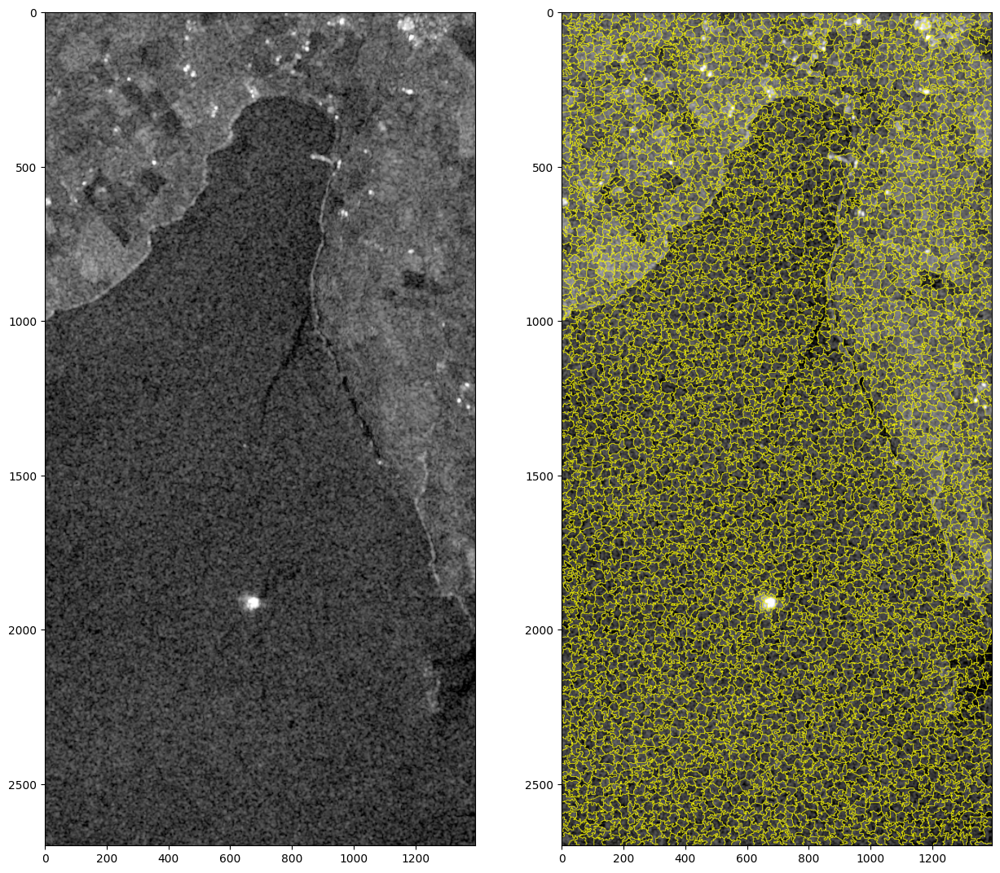

In [ ]:
# Importing required boundaries
from skimage.segmentation import slic, mark_boundaries
from skimage.data import astronaut

# Setting the plot figure as 15, 15
plt.figure(figsize=(15, 15))

# Sample Image of scikit-image package
astronaut = image

# Applying SLIC segmentation
# for the edges to be drawn over
astronaut_segments = slic(astronaut,
						n_segments=5000,
						compactness=10)

plt.subplot(1, 2, 1)

# Plotting the original image
plt.imshow(astronaut)

# Detecting boundaries for labels
plt.subplot(1, 2, 2)

# Plotting the output of marked_boundaries
# function i.e. the image with segmented boundaries
plt.imshow(mark_boundaries(astronaut, astronaut_segments))


In [ ]:
%pip install segment-geospatial leafmap localtileserver > /dev/null 2>&1;
%pip install rasterstats > /dev/null 2>&1;
import os
import leafmap
import localtileserver
import io
import requests
import ee
from samgeo import SamGeo, show_image, download_file, overlay_images, tms_to_geotiff
import geopandas as gpd
import numpy as np
import rasterio
from rasterio.mask import mask
%pip install pycrs
import pycrs

  Preparing metadata (setup.py) ... done
  Created wheel for pycrs: filename=PyCRS-1.0.2-py3-none-any.whl size=32688 sha256=cf42d26b9abcd2d4c6fb3970dd57d97af112af541ba4c039b3cbf05058dddf39
  Stored in directory: /root/.cache/pip/wheels/47/1d/70/7a5bdf33347e7c75e95b06b1fa38f076a59a9506653cc24aff
Successfully built pycrs


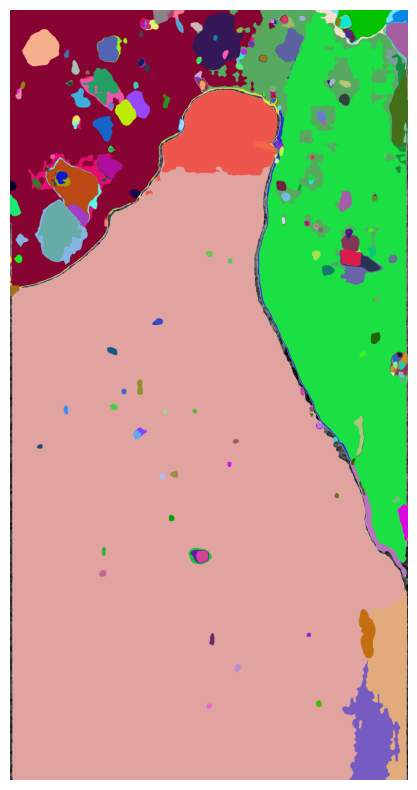

In [ ]:
my_kwargs = {
    "points_per_side": 140,
    "pred_iou_thresh": 0.5,           #0.7   going lower makes more polygons but small and sketchy, going higher makes less small things but miss detail
    "stability_score_thresh": 0.5,    #0.8 going higher
    "min_mask_region_area": 200,
}

sam = SamGeo(
    model_type="vit_h",
    checkpoint='sam_vit_h_4b8939.pth',
    sam_kwargs=my_kwargs
)
sam.generate(image, output=None, foreground=True, unique=True)  # Change poutput to none??
sam.show_anns(axis="off", alpha=1, output="annotations.tif")

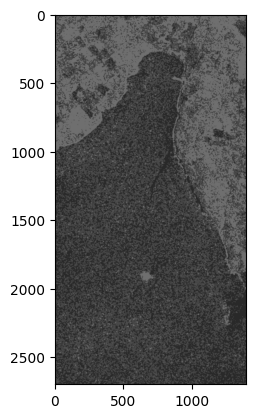

In [ ]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Load the image
image = cv2.imread('/content/drive/MyDrive/HMS ROYAL OAK/HMS ROYAL OAK_17.jpg')

# Reshape the image to a 2D array of pixels
pixels = image.reshape((-1, 3))

# Convert to floating point
pixels = np.float32(pixels)

# Define criteria and apply kmeans()
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 300, 0.2)
k = 3
_, labels, centers = cv2.kmeans(pixels, k, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)

# Convert back to 8 bit values
centers = np.uint8(centers)

# Map the centers to the labels to segment the image
segmented_image = centers[labels.flatten()]

# Reshape back to the original image
segmented_image = segmented_image.reshape(image.shape)

# Display the segmented image using matplotlib
plt.imshow(cv2.cvtColor(segmented_image, cv2.COLOR_BGR2RGB))
plt.show()


NameError: ignored

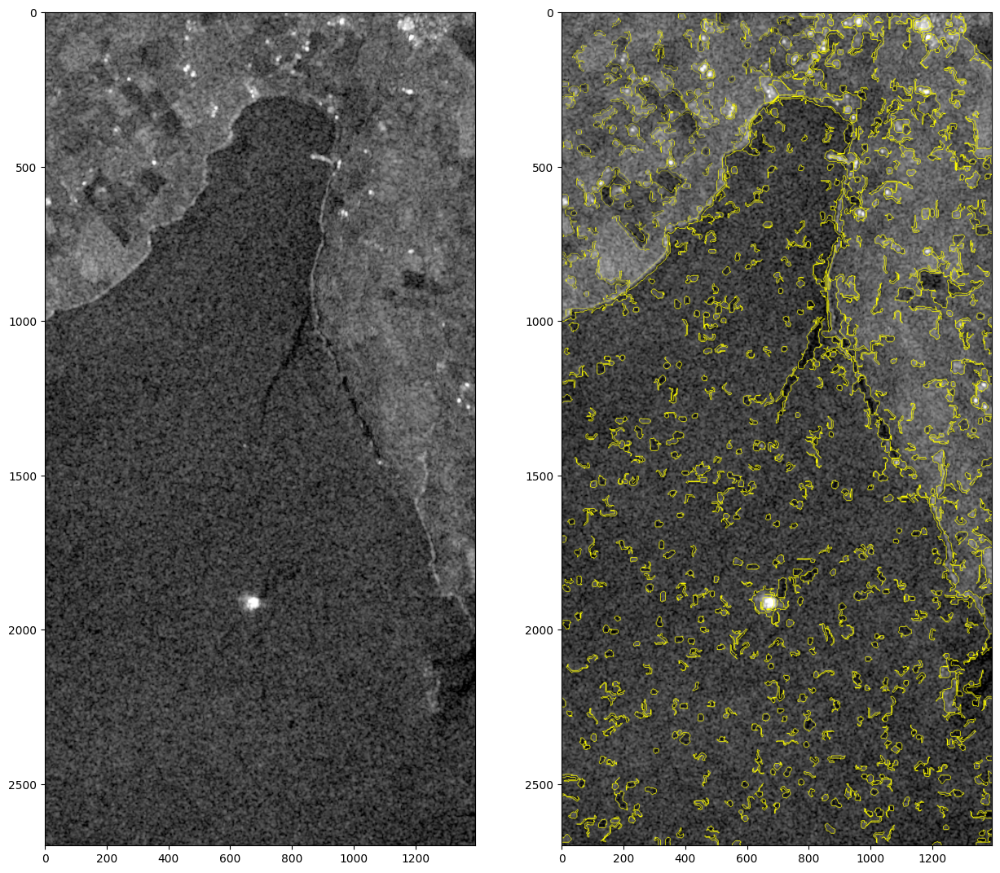

In [ ]:
# Importing the required libraries
from skimage.segmentation import felzenszwalb, mark_boundaries
from skimage.color import label2rgb
from skimage.data import astronaut

# Setting the figure size as 15, 15
plt.figure(figsize=(15,15))

# Sample Image of scikit-image package
astronaut = image

# computing the Felzenszwalb's
# Segmentation with sigma = 5 and minimum
# size = 100
astronaut_segments = felzenszwalb(astronaut,
								scale = 100,
								sigma=5,
								min_size=200)

# Plotting the original image
plt.subplot(1,2,1)
plt.imshow(astronaut)

# Marking the boundaries of
# Felzenszwalb's segmentations
plt.subplot(1,2,2)
plt.imshow(mark_boundaries(astronaut,
						astronaut_segments))


In [ ]:
import cv2
import numpy as np
from skimage.segmentation import felzenszwalb
from skimage.color import label2rgb
from skimage.measure import regionprops
from matplotlib import pyplot as plt

props = regionprops(astronaut_segments)


image = Image.open('/content/drive/MyDrive/HMS ROYAL OAK/HMS ROYAL OAK_17.jpg')
from PIL import Image, ImageDraw, ImageFont
image = image.convert('RGB')
draw = ImageDraw.Draw(image)
width, height = image.size
x, y = width // 2, height // 2

# Loop over each segment
for prop in props:
    # Calculate aspect ratio of minimum bounding rectangle
    minr, minc, maxr, maxc = prop.bbox
    aspect_ratio = (maxc - minc) / (maxr - minr)

    # Check if segment is long and thin
    if aspect_ratio > 2:
        # Calculate distance from centroid to specific point
        centroid = prop.centroid
        distance = np.sqrt((centroid[0] - x)**2 + (centroid[1] - y)**2)

        # Check if distance is less than 200 pixels
        if distance < 200:
            # This segment is a long, thin object within 200 pixels of the point
            print(f'Segment {prop.label} is a long, thin object within 200 pixels of the point')

1350

In [ ]:
# Define a function to process each image
#image = cv2.imread('/content/drive/MyDrive/HMS ROYAL OAK/HMS ROYAL OAK_17.jpg')
image = Image.open('/content/drive/MyDrive/HMS ROYAL OAK/HMS ROYAL OAK_17.jpg')
from PIL import Image, ImageDraw, ImageFont
image = image.convert('RGB')
draw = ImageDraw.Draw(image)
width, height = image.size
x, y = width // 2, height // 2
draw.ellipse((x - 10, y - 10, x + 10, y + 10), fill='red')

1350

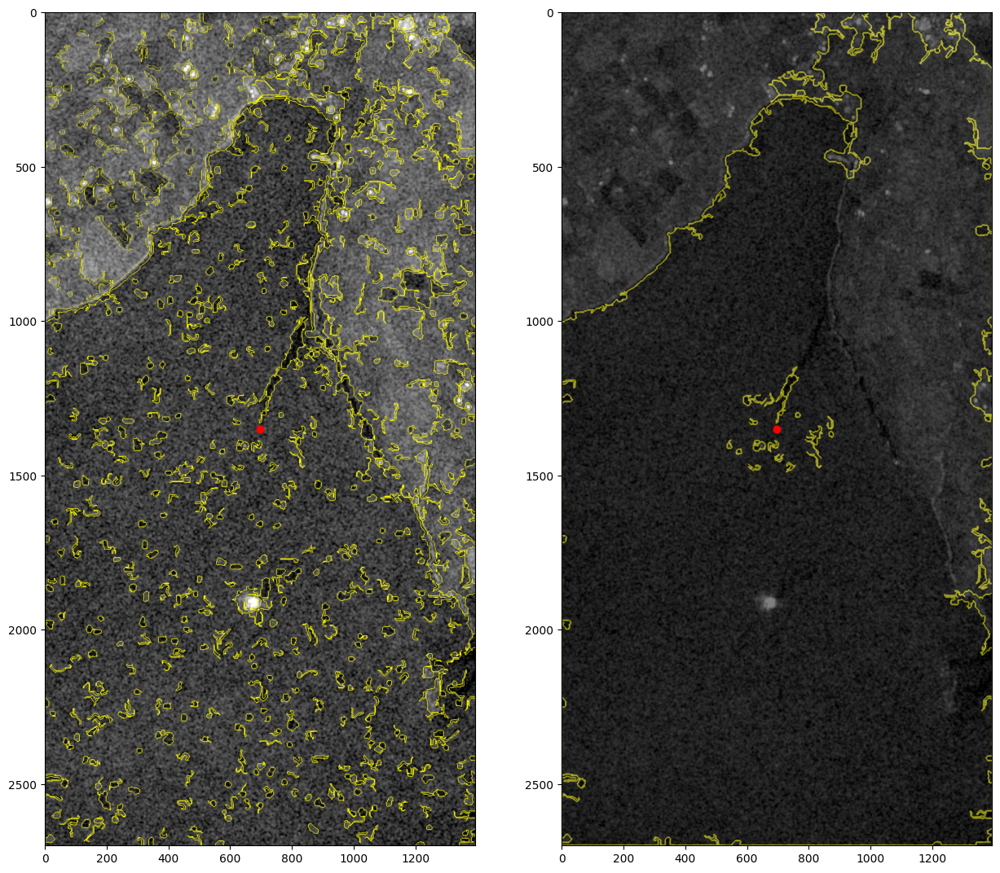

In [ ]:
import cv2
import numpy as np
from skimage.segmentation import felzenszwalb
from skimage.color import label2rgb
from skimage.measure import regionprops, label
from matplotlib import pyplot as plt
image = cv2.imread('/content/drive/MyDrive/HMS ROYAL OAK/HMS ROYAL OAK_17.jpg')
segments = felzenszwalb(image, scale=100, sigma=5, min_size=200)
# Label the segments
labeled_segments = label(segments)

# Invert the segments
inverted_segments = np.max(segments) - segments

# Label the inverted segments (enclosed areas)
labeled_enclosed_areas = label(inverted_segments)

# Ensure that labels for enclosed areas do not overlap with labels for original segments
labeled_enclosed_areas += np.max(labeled_segments)

# Combine the labels
combined_labels = labeled_segments + labeled_enclosed_areas


props = regionprops(labeled_enclosed_areas)
image2 = Image.open('/content/drive/MyDrive/HMS ROYAL OAK/HMS ROYAL OAK_17.jpg')
from PIL import Image, ImageDraw, ImageFont
image2 = image2.convert('RGB')
draw = ImageDraw.Draw(image2)
width, height = image2.size
x, y = width // 2, height // 2

# Create an empty image to draw the contours on
contour_image = np.zeros_like(image)

# Loop over each segment
for prop in props:
    # Calculate aspect ratio of minimum bounding rectangle
    minr, minc, maxr, maxc = prop.bbox
    aspect_ratio = (maxc - minc) / (maxr - minr)

    # Check if segment is long and thin
    #if aspect_ratio > 0.5:
        # Calculate distance from centroid to specific point
    centroid = prop.centroid
    distance = np.sqrt((centroid[0] - y)**2 + (centroid[1] - x)**2)

        # Check if distance is less than 200 pixels
    if distance < 500:
            # This segment is a long, thin object within 200 pixels of the point
            #print(f'Segment {prop.label} is a long, thin object within 200 pixels of the point')

            # Draw the contour of this segment on the contour image in yellow color
            segment_mask = (segments == prop.label)
            contours, _ = cv2.findContours(segment_mask.astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
            cv2.drawContours(contour_image, contours, -1, (0, 255, 255), 3)  # Yellow color in BGR
plt.figure(figsize=(15,15))
# Display the contour image using matplotlib
plt.subplot(1,2,1)
plt.imshow(mark_boundaries(image,
						inverted_segments))
plt.scatter([x], [y], color='red')
# Marking the boundaries of
# Felzenszwalb's segmentations
plt.subplot(1,2,2)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.imshow(cv2.cvtColor(contour_image, cv2.COLOR_BGR2RGB), alpha=0.5)
plt.scatter([x], [y], color='red')
plt.show()


In [ ]:
print(type(segments))
print(type(prop.label))
print(segments)
print(prop.label)

376


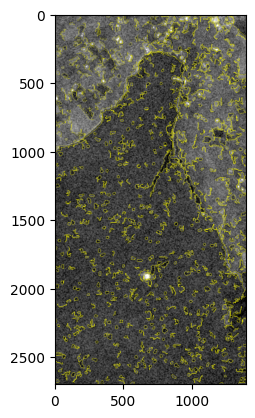

In [ ]:
plt.subplot(1,2,2)
plt.imshow(mark_boundaries(astronaut,
						astronaut_segments))

In [ ]:
image = cv2.imread('/content/drive/MyDrive/HMS ROYAL OAK/HMS ROYAL OAK_17.jpg')
segments = felzenszwalb(image, scale=100, sigma=5, min_size=200)
# Label the segments
labeled_segments = label(segments)

# Invert the segments
inverted_segments = np.max(segments) - segments

# Label the inverted segments (enclosed areas)
labeled_enclosed_areas = label(inverted_segments)

# Ensure that labels for enclosed areas do not overlap with labels for original segments
labeled_enclosed_areas += np.max(labeled_segments)

# Combine the labels
combined_labels = labeled_segments + labeled_enclosed_areas
props = regionprops(labeled_enclosed_areas)

In [ ]:
  out_dir = f'/content/drive/MyDrive/{WRKdropdown.value}'                                           # Make it the directory to save to
  files = os.listdir(out_dir)                                                                              # List all the files in \content\
  jpg_files = [file for file in files if file.endswith('.jpg')]                                     # New list of all the jpg files
  jpg_files.sort()                                                                                  # Sort so in date order

  ## Create mp4 timelapse
  import imageio                                                                                    # Package to write mp4
  os.chdir(out_dir)                                                                                 # Doesnt like to use folder paths for some reason

  if len(jpg_files) > 2000:
    mid_index = len(jpg_files) // 2
    jpg_files1 = jpg_files[:mid_index]
    jpg_files2 = jpg_files[mid_index:]

    # Create the first video
    out_mp4_1 = os.path.abspath(f"{WRKdropdown.value}_1.mp4")
    frames1 = [Image.open(image) for image in jpg_files1]
    imageio.mimwrite(out_mp4_1, frames1, fps=0.5, quality=10, codec='mjpeg')

    # Create the second video
    out_mp4_2 = os.path.abspath(f"{WRKdropdown.value}_2.mp4")
    frames2 = [Image.open(image) for image in jpg_files2]
    imageio.mimwrite(out_mp4_2, frames2, fps=0.5, quality=10, codec='mjpeg')
  else:
    # Create a single video if there are 2000 or fewer images
    out_mp4 = os.path.abspath(f"{WRKdropdown.value}.mp4")
    frames = [Image.open(image) for image in jpg_files]
    imageio.mimwrite(out_mp4, frames, fps=0.5, quality=10, codec='mjpeg')

  out_mp4 = os.path.abspath(f"{WRKdropdown.value}.mp4")                                             # Path to save the gif
  frames = [Image.open(image) for image in jpg_files]                                               # Open the jpgs
  imageio.mimwrite(out_mp4, frames, fps=0.5, quality=10,  codec='mjpeg')                            # Write the mp4 to \content\
  for image in jpg_files:                                                                           # Loop through through the jpgs
    os.remove(image)                                                                                # Remove the jpgs
  print('Timelapse created')                                                                        # Print completed
  os.chdir('/content')

'/content/drive/MyDrive/MV INVERDARGLE (Stern)'

# 3.1 Downloading and Viewing Timelapses

You can download the videos by going to the files on the right hand side, hover over the timelapse of interest and click the three dots to the right of the name. Click download from the popup box and your web browser should automatically start downloading it. If you cannot play the video on your computer you may need to download the latest 'mp4' codecs for playing the video software on your laptop, alternatively you can download a free open source videoplayer called VLC that has many of these built in and is widely used as an alternative. This can be downloaded from the [VLC website](https://www.videolan.org/vlc/). You may need admin permissions to install.

Alternatively, you can drag and drop your timelapses into your drive and then view them in your google drive online.

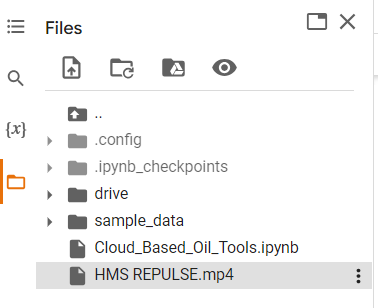

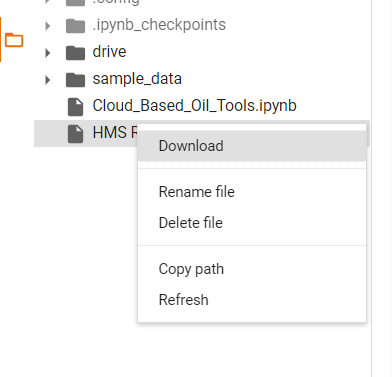

#4 Run the Mapping tool

In [ ]:
OilMapping()

Map(center=[3.620619000000001, 104.34518100000001], controls=(WidgetControl(options=['position', 'transparent_…

##4.1 Displaying the data
Run the below code to show the data. Here you can also add a comment for the previous image. i.e. **Commit comment** once you have gone to the next or previous image

*Note for the comment to show in the table you need to rerun the code*

In [ ]:
Display_Data()

##4.2 Tool for optimising the Threshold
Draw a line on the map across the suspected oil spill then run the tool below get an interactive chart. For detailed instructions see below section `3.21`

##4.21 Instructions on how to optimise the thresholding

If you are having difficulties getting the correct value for the threshold you can use the below tool.
First clear all drawing on the map by using the bin icon in the widgets on the left hand side and press clear all. 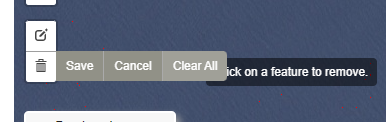

Afterwards draw a line across the expected oil leak like the image below using the line tool. Double click the last point to finish the line.

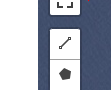

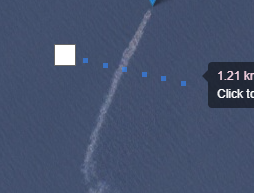

 Note the line can have multiple points and doesnt have to be straight. The graph produced is interactive and the threshold can then be determined.

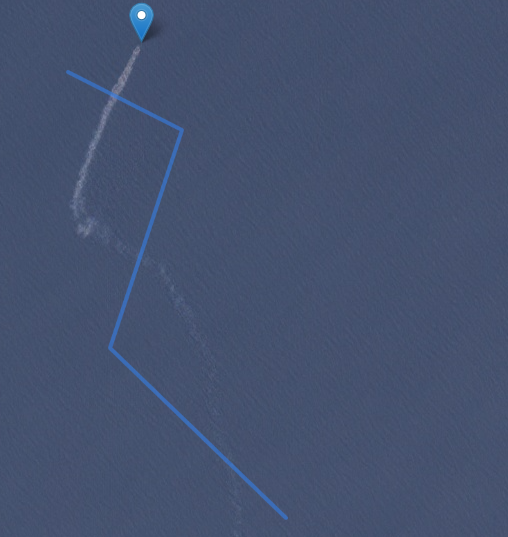



##4.22 Threshold tool
Before running, draw a small line across any potential oil features then run the tool as instructions above. The result is a plot with pixel values across this line where you can attempt to pick out a value.

In [ ]:
value_detector(img)

# 4 Final Figure
Plots the all the polygons on an interactive map to explore

In [ ]:
Plot_Polygons()

#5 Download polygons as shapefile
Downloads the polygons as a shapefile. Note this is to the GoogleColab workspace so need to either download or drag and drop to your GoogleDrive.

In [ ]:
geemap.ee_export_vector(Oil_Polygons, filename='Oil_Polygons.shp')

# 6 Download the Data as a CSV

In [ ]:
Datatable.to_csv(f'{WRKdropdown.value}_Oil_Spill_Data.csv')

#**6 Tools in development please DONT RUN**

## 6.1 Segment Anything Tool

***SUPER COMPUTATIONAL EFFORT REQUIRED. CAN BE PROGRESSED WITH PAID RESOURCES.***

link to GitHub [Segment-geospatial](https://github.com/opengeos/segment-geospatial?s=03 )

In [ ]:
%pip install segment-geospatial leafmap localtileserver > /dev/null 2>&1;
import os
import leafmap
from samgeo import SamGeo, show_image, download_file, overlay_images, tms_to_geotiff
import localtileserver
import io
import requests
import ee

Get image collections

In [ ]:
global Lat, Lon
Wrecks = pd.read_excel('/content/drive/MyDrive/Wreck Database_V2.4.xls')                          # Load in the wreck list
Lat = pd.to_numeric(Wrecks.loc[Wrecks['Wreck_ID'] == WRKdropdown.value]['Latitude'])              # Get the latitude of selected wreck
Lon = Wrecks.loc[Wrecks['Wreck_ID'] == WRKdropdown.value]['Longitude']                            # Get the longitude of selected wreck
geom = ee.Geometry.Point(Lon.iloc[0],Lat.iloc[0]);                                                # Loction of chosen wreck

  ## Get the imageCollection, s1, s2 or both then combine
if SatelliteNo.value == 'SENTINEL-1' or SatelliteNo.value == 'BOTH':                              # If to see if create feature collection with S1 or both
    S1ImgCol = (ee.ImageCollection('COPERNICUS/S1_GRD').                                            # Selects the Sentinel 1 image collection
      filterDate(str(StartDate.value), str(EndDate.value)).                                         # Selects only the dates from time period chosen above
      filterMetadata('instrumentMode', 'equals', 'IW').                                             # Selects the instrument mode that we want
      filter(ee.Filter.eq('orbitProperties_pass', str(orbit.value))).                               # Selects the orbit path we want
      filterBounds(geom))                                                                           # Selects only images that our wreck is contained within
    S1ImgCol = S1ImgCol.map(add_S1_date)                                                            # Adds the image date to image metadata in easy way to read

if SatelliteNo.value == 'SENTINEL-2' or SatelliteNo.value == 'BOTH':                              # If to see if create feature collection with S2 or both
   S2ImgCol = (ee.ImageCollection('COPERNICUS/S2_HARMONIZED').                                      # Selects the Sentinel 2 image collection
     filterDate(str(StartDate.value), str(EndDate.value)).                                          # Selects only the dates from time period chosen above
     filterBounds(geom).                                                                            # Selects only images that our wreck is contained within
     filterMetadata('CLOUDY_PIXEL_PERCENTAGE', 'less_than', max_cloud_cover.value))                 # Filter image collection by cloud cover
   S2ImgCol = S2ImgCol.map(add_S2_date)                                                             # Add the image date to the metadata in an easy way to read

if SatelliteNo.value == 'BOTH':                                                                   # If both S1 and S2 combine collections
   ImageCol = S1ImgCol.merge(S2ImgCol)                                                              # Merge ImageCollections, note raw S1
   ImageCol = ImageCol.sort("Date")                                                                 # Order images by Date
elif SatelliteNo.value == 'SENTINEL-1':                                                           # Create collections based just on S1
   ImageCol = S1ImgCol                                                                              # ImageCollection = S1
elif  SatelliteNo.value == 'SENTINEL-2':                                                          # Create collections based just on S2
   ImageCol = S2ImgCol                                                                              # ImageCollection = S2

  ## Method of skipping duplicate images
ImgList = ee.ImageCollection(ImageCol).toList(99999)                                              # Get the imageCollection as a list
date_string = '1066-01-01'                                                                        # Store the previous date, use really old date here at start
count = int(ImageCol.size().getInfo())                                                            # Get number of images
for i in range(0, count):                                                                         # Loop through the images
   PrevDate = date_string                                                                           # Store previous date
   img = ee.Image(ee.List(ImgList).get(i))                                                          # Get the next image in the list
   IMgdate = img.date()                                                                             # Get the acquisition date of the image
   date_string = IMgdate.format('YYYY-MM-dd').getInfo()                                             # Format the date as a string
   if date_string == PrevDate:                                                                      # If image dates the same
     image_id = ee.Image(img).getString('system:index').getInfo()                                   # Get new image date
     ImageCol = ImageCol.filter(ee.Filter.neq('system:index', image_id))                            # Remove the duplicate
ImgList = ee.ImageCollection(ImageCol).toList(99999)                                              # New list after removing of duplicates

  ## DOWNLOADS THE JPEGS #####
out_mp4 = os.path.abspath(f"{WRKdropdown.value}.mp4")                                             # Path to save the gif
out_dir = os.path.dirname(out_mp4)                                                                # Directory to save the gif
img_params = {'min': 0,'max': 3000,'bands': ['B4','B3','B2']}                                     # Otherwise select the RGB bands
count = ImageCol.size().getInfo()                                                                # New count with replicates removed
names = [os.path.join( out_dir, f"{WRKdropdown.value}_{str(i+1).zfill(int(len(str(count))))}.jpg")# List of image names to save adds a number.
         for i in range(count)]                                                                     # Loop for the number of names required
get_image_collection_thumbnails(                                                                  # Function adapted from geeMap
    ImageCol,                                                                                       # Image collection
    out_dir,                                                                                        # Where to save
    vis_params=img_params,                                                                          # Image paramters, placeholder changed in next script based on satellite
  dimensions=resolution.value,                                                                      # Dimensions = resolution
  names=names)
ImageCol.first()

not ran this chunk

In [ ]:
if m.user_roi_bounds() is not None:
    bbox = m.user_roi_bounds()
else:
    bbox = [-122.2659, 37.8682, -122.2521, 37.8741]

dist = 0.05
roi = ee.Geometry.BBox(Lon.iloc[0] - dist, Lat.iloc[0]- dist,Lon.iloc[0]+ dist, Lat.iloc[0] +dist)
roi = [Lon.iloc[0] - dist, Lat.iloc[0]- dist, Lon.iloc[0]+ dist, Lat.iloc[0] +dist]

In [ ]:
imageGEO = "satellite.tif"
tms_to_geotiff(output=imageGEO, bbox=roi, zoom=10, source=ImageCol.first(), overwrite=True)

In [ ]:
m = leafmap.Map(center=[3.5, 104.5], zoom=7)
m.add_basemap("SATELLITE")
image = '/content/HMS REPULSE_1.jpg'
m.layers[-1].visible = False
m.add_raster(imageGEO, layer_name="Image")
m

In [ ]:
import ee
import geemap
import os

# Initialize the Earth Engine library
ee.Initialize()

# Define the image to export
image = ee.Image('LANDSAT/LE7_TOA_5YEAR/1999_2003')

# Define the visualization parameters for the image
landsat_vis = {'bands': ['B4', 'B3', 'B2'], 'gamma': 1.4}

# Define the region of interest
geom = ee.Geometry.Polygon(
    [[
        [-115.413031, 35.889467],
        [-115.413031, 36.543157],
        [-114.034328, 36.543157],
        [-114.034328, 35.889467],
        [-115.413031, 35.889467]
    ]]
)
feature = ee.Feature(geom, {})
roi = feature.geometry()

# Define the output directory and filename
out_dir = os.path.join(os.path.expanduser('~'), 'Downloads')
filename = os.path.join(out_dir, 'landsat.tif')

# Export the image to a local file
geemap.ee_export_image(ImageCol.first(),filename ='raster.tif', scale=10, region=roi, file_per_band=False)


Generating URL ...
Please wait ...
Data downloaded to /content/raster.tif


ran from here

In [ ]:
my_kwargs2 = {'points_per_batch': 8,'pred_iou_thresh': 0.5,'stability_score_thresh':0.8}
my_kwargs = {'pred_iou_thresh': 0.6,'stability_score_thresh':0.8}

In [ ]:
sam = SamGeo(
    model_type="vit_h",
    checkpoint='sam_vit_h_4b8939.pth',
    sam_kwargs=my_kwargs
)

Model checkpoint for vit_h not found.


Downloading...
From: https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth
To: /root/.cache/torch/hub/checkpoints/sam_vit_h_4b8939.pth
100%|██████████| 2.56G/2.56G [00:09<00:00, 260MB/s]


In [ ]:
image = '/content/HMS REPULSE_1.jpg'
raster = '/content/raster.tif'
mask = 'polygons.tif'
sam.generate('/content/raster.tif', output=mask, foreground=True, unique=True)

AttributeError: ignored

In [ ]:
import cv2

im = cv2.imread('/content/raster.tif')
print(im)

None


In [ ]:
orig_size = raster.shape[:2]

'/content/raster.tif'

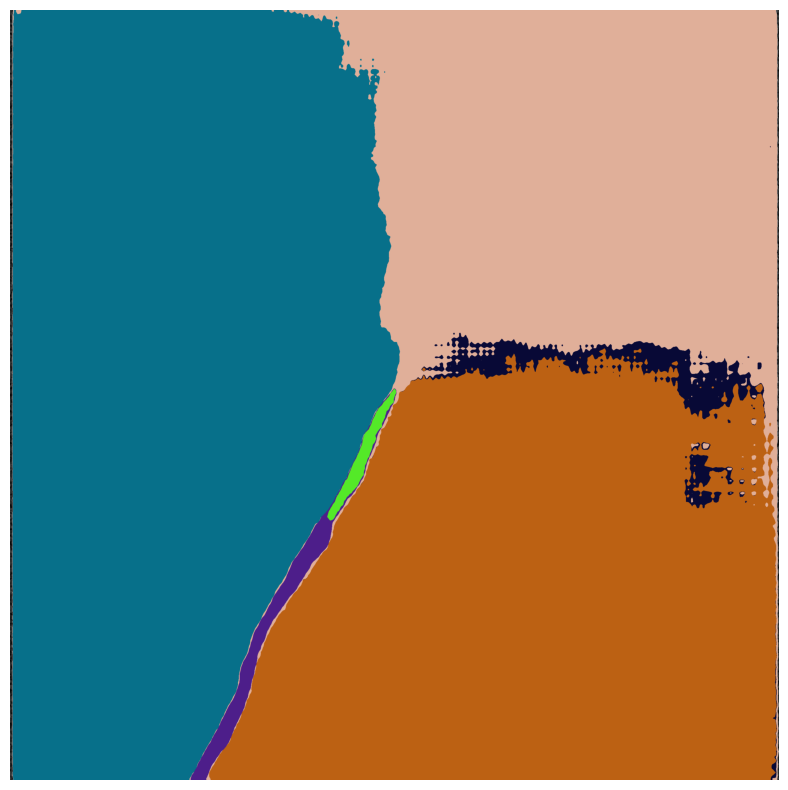

In [ ]:
sam.show_anns(axis="off", alpha=1, output="annotations.tif")


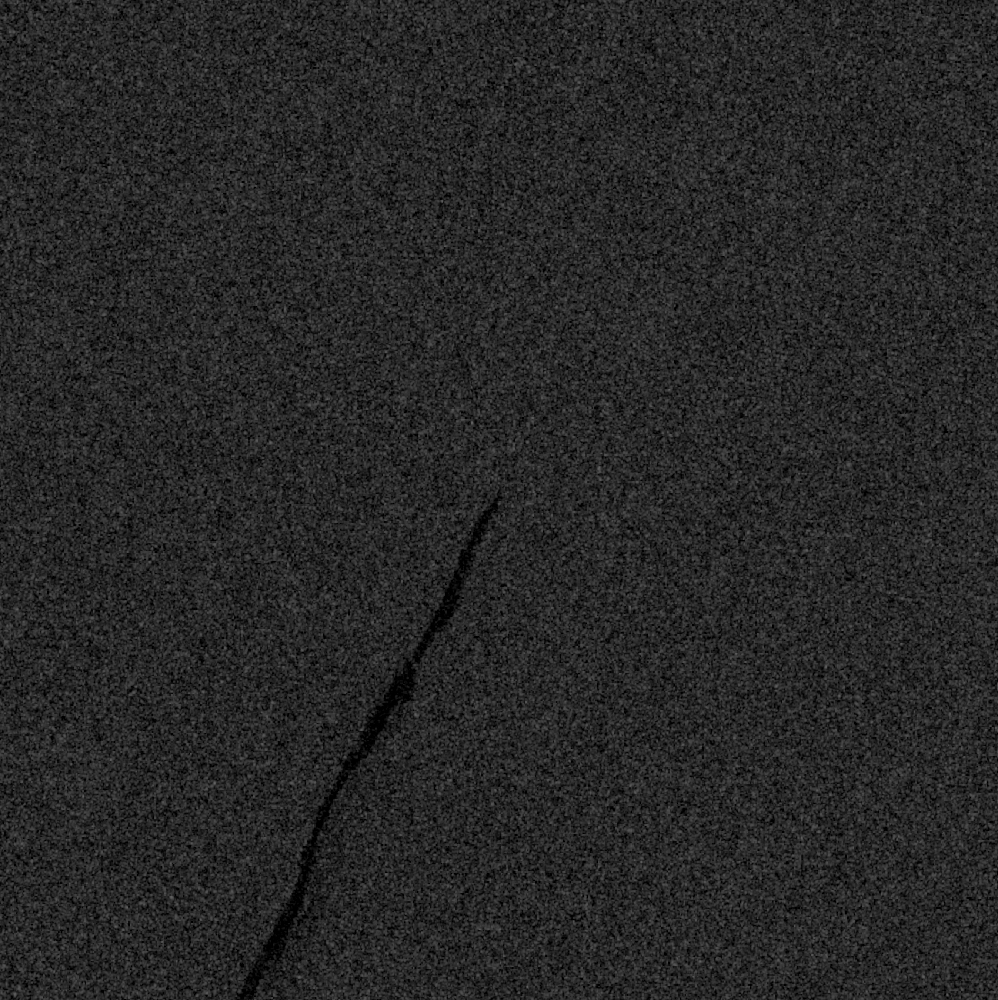
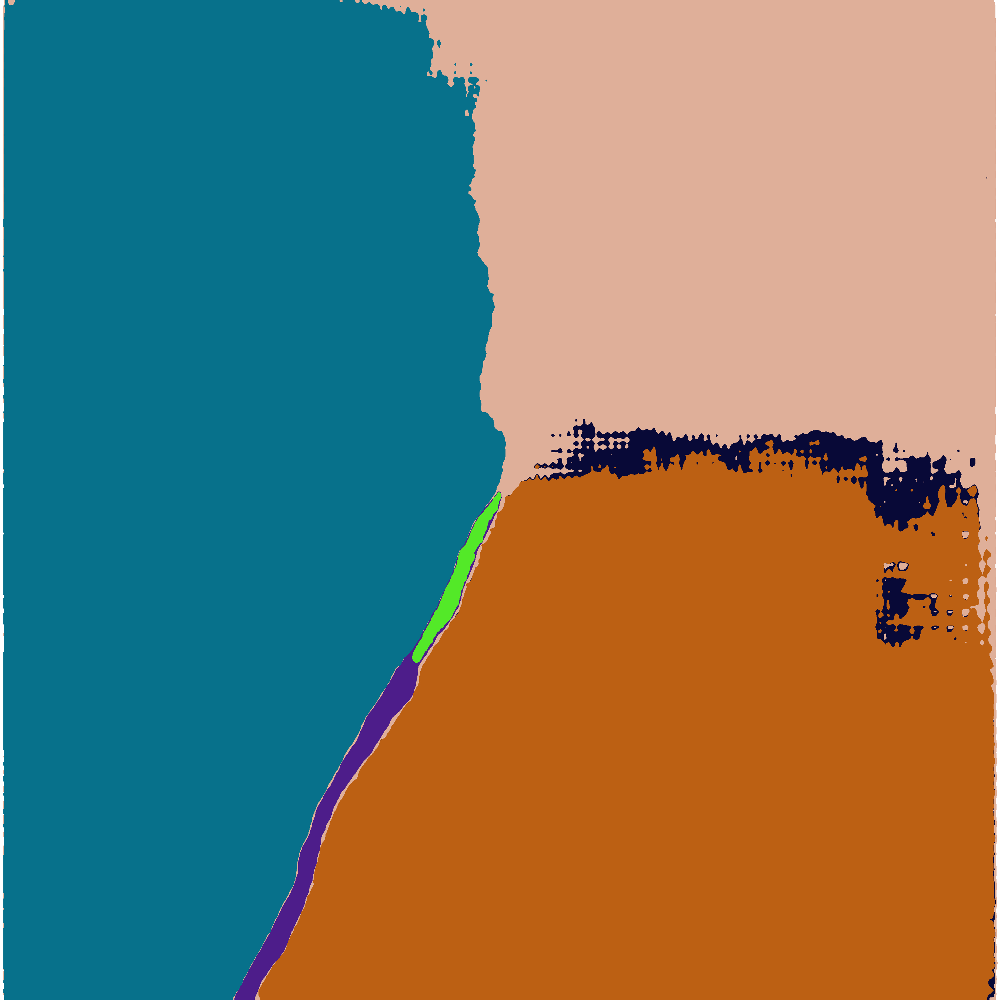

In [ ]:
leafmap.image_comparison(
    image,
    "annotations.tif",
    label1="Satellite Image",
    label2="Image Segmentation",
)

In [ ]:
import numpy as np
from matplotlib.image import imread

image = '/content/HMS REPULSE_1.jpg'
mask = 'polygons.tif'
#sam.generate(image, output=mask, foreground=True, unique=True)

# read the image and mask
img = imread(image)
mask_img = imread(mask)

# get the unique polygon labels
labels = np.unique(mask_img)

# initialize a dictionary to store the average pixel values for each polygon
avg_pixel_values = {}

# iterate over the unique polygon labels
for label in labels:
    # get the pixel coordinates for the current polygon label
    x, y = np.where(mask_img == label)

    # get the pixel values for the current polygon label
    pixel_values = img[x, y]

    # calculate the average pixel value for the current polygon label
    avg_pixel_value = np.mean(pixel_values)

    # store the average pixel value in the dictionary
    avg_pixel_values[label] = avg_pixel_value

# print the average pixel values for each polygon
print(avg_pixel_values)


{0: 39.956660819316895, 2: 12.482288828337875, 5: 37.91857506361323, 6: 39.057712666250175}


In [ ]:
vector = "segments.gpkg"
sam.tiff_to_gpkg(mask, vector, simplify_tolerance=None)

In [ ]:
sam.raster_to_vector("annotations.tif", "polygon.shp")

In [ ]:
style = {
    "color": "#3388ff",
    "weight": 2,
    "fillColor": "#7c4185",
    "fillOpacity": 0.5,
}
m.add_vector(vector, layer_name="Vector", style=style)
m

In [ ]:
!pip install pycrs > /dev/null 2>&1;
import pycrs
seg = geemap.shp_to_ee("masks_gcs.shp")
Map.addLayer(seg,{}, 'polygons')
Map